# Course Description 

Hypothesis testing lets you answer questions about your datasets in a statistically rigorous way. In this course, you'll grow your Python analytical skills as you learn how and when to use common tests like t-tests, proportion tests, and chi-square tests. Working with real-world data, including Stack Overflow user feedback and supply-chain data for medical supply shipments, you'll gain a deep understanding of how these tests work and the key assumptions that underpin them. You'll also discover how non-parametric tests can be used to go beyond the limitations of traditional hypothesis tests. 

# Table of contents 

- ## 1. Introduction to Hypothesis Testing 

    - ### Hypothesis tests and z-scores
    
    - ### p-values
    
    - ### Statistical significance 

- ## 2. Two-Sample and ANOVA Tests

    - ### Performing t-tests 
    
    - ### Calculating p-values from t-statistics 
    
    - ### Paired t-tests
    
    - ### ANOVA tests 

- ## 3. Proportion Tests

    - ### One-sample proportion tests 
    
    - ### Two-sample proportion tests 
    
    - ### Chi-square test of independence 
    
    - ### Chi-square goodness of fit tests 

- ## 4. Non-Parametric Tests

    - ### Assumptions in hypothesis testing 
    
    - ### Non-parametric testss 
    
    - ### Non-parametric ANOVA and unpaired t-tests 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import norm
from scipy.stats import t
from scipy.stats import chisquare
from scipy.stats import rankdata

import pingouin

from statsmodels.stats.proportion import proportions_ztest

<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [2]:
path = '/Users/wenwen/Courses/ONLINE/DataCamp/data/'
stack_overflow = pd.read_feather(path + 'stack_overflow.feather')

---
# 1. Introduction to Hypothesis Testing 

## Hypothesis tests and z-scores

### Stack Overflow Developer Survey 2020

#### This is a subset of the survey responses from users who identified as Data Scientists. 


In [3]:
stack_overflow.head()

,respondent,main_branch,hobbyist,age,age_1st_code,age_first_code_cut,comp_freq,comp_total,converted_comp,country,...,survey_length,trans,undergrad_major,webframe_desire_next_year,webframe_worked_with,welcome_change,work_week_hrs,years_code,years_code_pro,age_cat
0,36.0,"I am not primarily a developer, but I write co...",Yes,34.0,30.0,adult,Yearly,60000.0,77556.0,United Kingdom,...,Appropriate in length,No,"Computer science, computer engineering, or sof...",Express;React.js,Express;React.js,Just as welcome now as I felt last year,40.0,4.0,3.0,At least 30
1,47.0,I am a developer by profession,Yes,53.0,10.0,child,Yearly,58000.0,74970.0,United Kingdom,...,Appropriate in length,No,"A natural science (such as biology, chemistry,...",Flask;Spring,Flask;Spring,Just as welcome now as I felt last year,40.0,43.0,28.0,At least 30
2,69.0,I am a developer by profession,Yes,25.0,12.0,child,Yearly,550000.0,594539.0,France,...,Too short,No,"Computer science, computer engineering, or sof...",Django;Flask,Django;Flask,Just as welcome now as I felt last year,40.0,13.0,3.0,Under 30
3,125.0,"I am not primarily a developer, but I write co...",Yes,41.0,30.0,adult,Monthly,200000.0,2000000.0,United States,...,Appropriate in length,No,None,None,None,Just as welcome now as I felt last year,40.0,11.0,11.0,At least 30
4,147.0,"I am not primarily a developer, but I write co...",No,28.0,15.0,adult,Yearly,50000.0,37816.0,Canada,...,Appropriate in length,No,"Another engineering discipline (such as civil,...",None,Express;Flask,Just as welcome now as I felt last year,40.0,5.0,3.0,Under 30


### Hypothesizing about the mean:

> The mean annual compensation of the population of data scientists is $110, 000

The point estimate (`sample statistic`):

In [4]:
stack_overflow['converted_comp'].mean()

119574.71738168952

The result is different from the hypothesis, **but is it meaningfully different? To answer this, we need to generate a bootstrap distribution of sample means.**

#### Generating a bootstrap distribution

In [5]:
# Step 3. Repeat step 1 & 2 many times, appending to a list
so_boot_distn = []

for i in range(5000):
    so_boot_distn.append(
        # Step 2. Calculate point estimate 
        np.mean(
            # Step 1. Resample
            stack_overflow.sample(frac=1, replace=True)['converted_comp']
        )
    )

#### Visualizing the bootstrap distribution

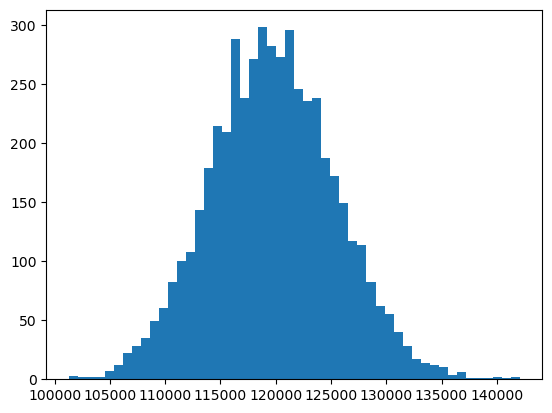

In [6]:
plt.hist(so_boot_distn, bins=50)
plt.show()

#### Standard error 

Standard deviation of the sample statistics in the bootstrap distribution estimates the standard error of the statistic. 

In [7]:
std_error = np.std(so_boot_distn, ddof=1)
std_error

5640.153086781108

### z-score 

Since variables have arbitrary units and ranges, before we test our hypothesis, we need to standardize the values. 

#### `The z-score is a standardized measure of the difference between the sample statistic and the hypothesized statistic.`

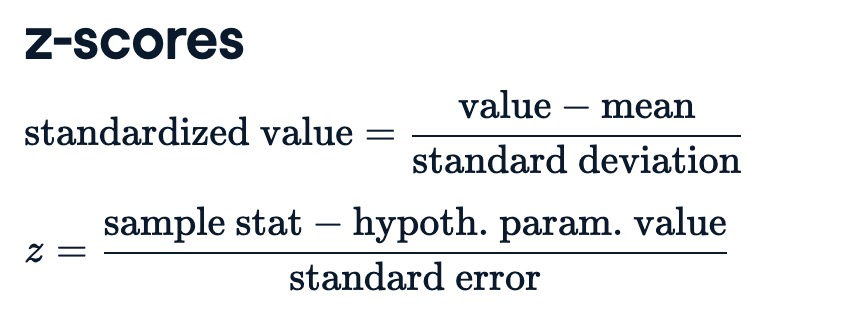

In [8]:
mean_comp_samp = stack_overflow['converted_comp'].mean()
mean_comp_hyp = 110000
z_score = (mean_comp_samp - mean_comp_hyp) / std_error
z_score

1.6975988478273576

### Testing the hypothesis 

#### Is 1.723 a high or low value? --> Determining this is the goal of this course. 

#### We can now state one of the use cases of hypothesis testing:

> Determine whether sample statistics are close to or far away from expected (or "hypothesized" values)

---
### Standard normal (z) distribution

`It's often called the z-distribution, and z-scores are related to this distribution.`

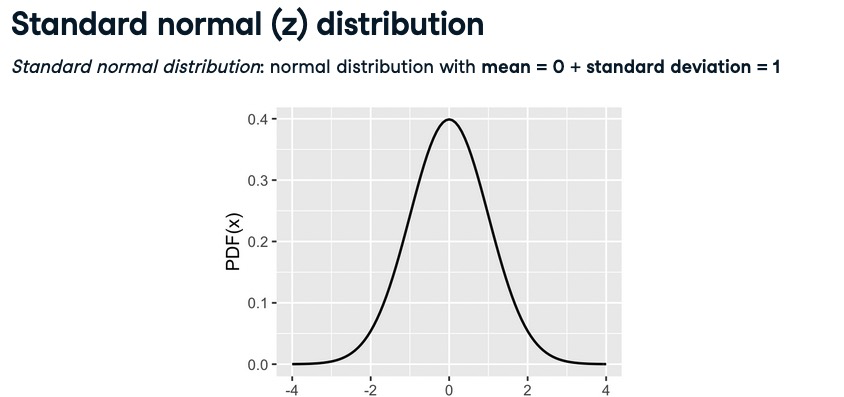

---
### Exercise: `late_shipments`

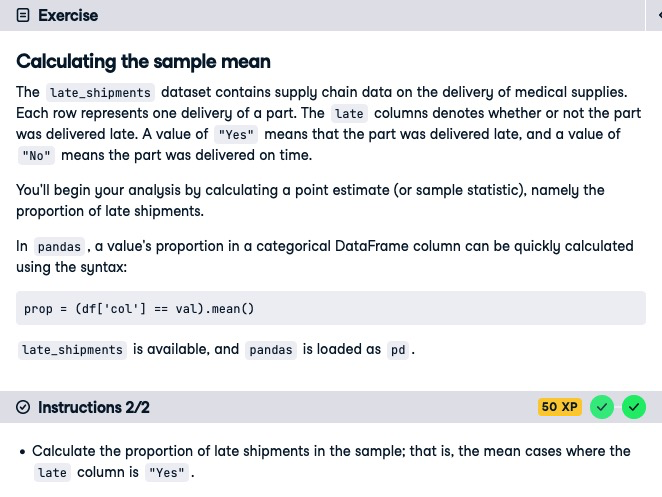

In [9]:
late_shipments = pd.read_feather(path+'late_shipments.feather')
late_shipments.head()

,id,country,managed_by,fulfill_via,vendor_inco_term,shipment_mode,late_delivery,late,product_group,sub_classification,...,line_item_quantity,line_item_value,pack_price,unit_price,manufacturing_site,first_line_designation,weight_kilograms,freight_cost_usd,freight_cost_groups,line_item_insurance_usd
0,36203.0,Nigeria,PMO - US,Direct Drop,EXW,Air,1.0,Yes,HRDT,HIV test,...,2996.0,266644.00,89.00,0.89,"Alere Medical Co., Ltd.",Yes,1426.0,33279.83,expensive,373.83
1,30998.0,Botswana,PMO - US,Direct Drop,EXW,Air,0.0,No,HRDT,HIV test,...,25.0,800.00,32.00,1.60,"Trinity Biotech, Plc",Yes,10.0,559.89,reasonable,1.72
2,69871.0,Vietnam,PMO - US,Direct Drop,EXW,Air,0.0,No,ARV,Adult,...,22925.0,110040.00,4.80,0.08,Hetero Unit III Hyderabad IN,Yes,3723.0,19056.13,expensive,181.57
3,17648.0,South Africa,PMO - US,Direct Drop,DDP,Ocean,0.0,No,ARV,Adult,...,152535.0,361507.95,2.37,0.04,"Aurobindo Unit III, India",Yes,7698.0,11372.23,expensive,779.41
4,5647.0,Uganda,PMO - US,Direct Drop,EXW,Air,0.0,No,HRDT,HIV test - Ancillary,...,850.0,8.50,0.01,0.00,Inverness Japan,Yes,56.0,360.00,reasonable,0.01


#### Calculate the proportion of late shipments

In [10]:
late_prop_samp = (late_shipments['late']=='Yes').mean()
late_prop_samp

0.061

### Calculating a z-score

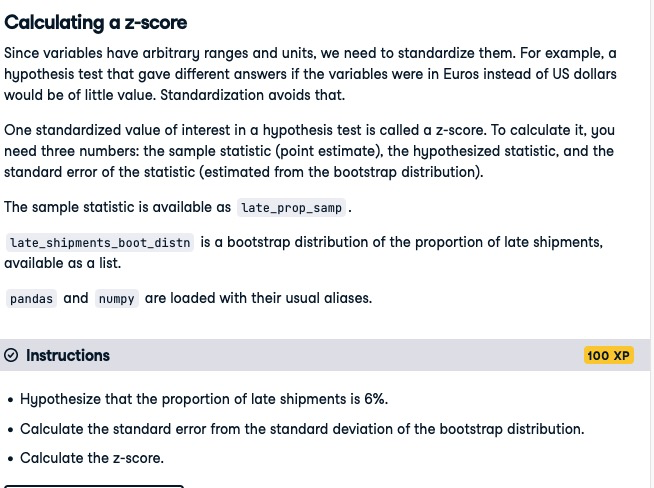

`STEP 1. Generating a bootstrap distribution`

In [11]:
# Step 3. Repeat step 1 & 2 many times, appending to a list
late_shipments_boot_distn = []

for i in range(5000):
    late_shipments_boot_distn.append(
        # Step 2. Calculate point estimate 
        # Step 1. Resample
        (late_shipments.sample(frac=1, replace=True)['late']=='Yes').mean()

    )

(array([  2.,   1.,   2.,   2.,   3.,   5.,   5.,  14.,  18.,  26.,  88.,
         64.,  87., 103., 107., 123., 157., 196., 200., 243., 493., 239.,
        247., 268., 264., 238., 248., 208., 218., 196., 307., 115., 104.,
         85.,  62.,  57.,  42.,  37.,  36.,  26.,  35.,  12.,   2.,   5.,
          2.,   4.,   1.,   0.,   1.,   2.]),
 array([0.035 , 0.0361, 0.0372, 0.0383, 0.0394, 0.0405, 0.0416, 0.0427,
        0.0438, 0.0449, 0.046 , 0.0471, 0.0482, 0.0493, 0.0504, 0.0515,
        0.0526, 0.0537, 0.0548, 0.0559, 0.057 , 0.0581, 0.0592, 0.0603,
        0.0614, 0.0625, 0.0636, 0.0647, 0.0658, 0.0669, 0.068 , 0.0691,
        0.0702, 0.0713, 0.0724, 0.0735, 0.0746, 0.0757, 0.0768, 0.0779,
        0.079 , 0.0801, 0.0812, 0.0823, 0.0834, 0.0845, 0.0856, 0.0867,
        0.0878, 0.0889, 0.09  ]),
 <BarContainer object of 50 artists>)

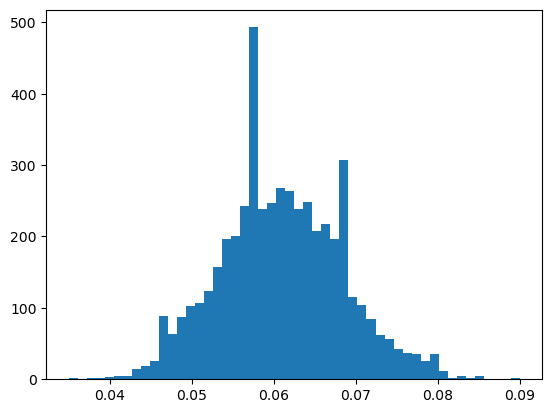

In [12]:
plt.hist(late_shipments_boot_distn, bins=50)

`STEP 2. Hypothesize that the proportion of late shipments is 6%`

In [13]:
late_prop_hyp = 0.06

`STEP 3. Calculate the standard error from the standard deviation of the bootstrap distribution`

In [14]:
std_error = np.std(late_shipments_boot_distn, ddof=1)

`STEP 4. Calculate the z-score.`

In [15]:
late_shipments_z_score = (late_prop_samp - late_prop_hyp) / std_error
late_shipments_z_score

0.13234604603942896

---
## p-values

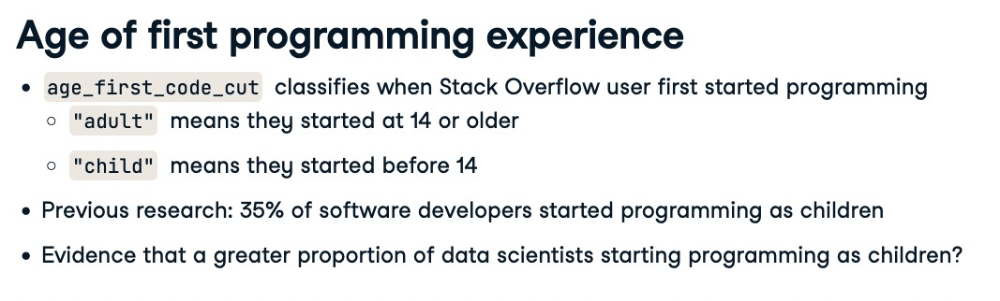

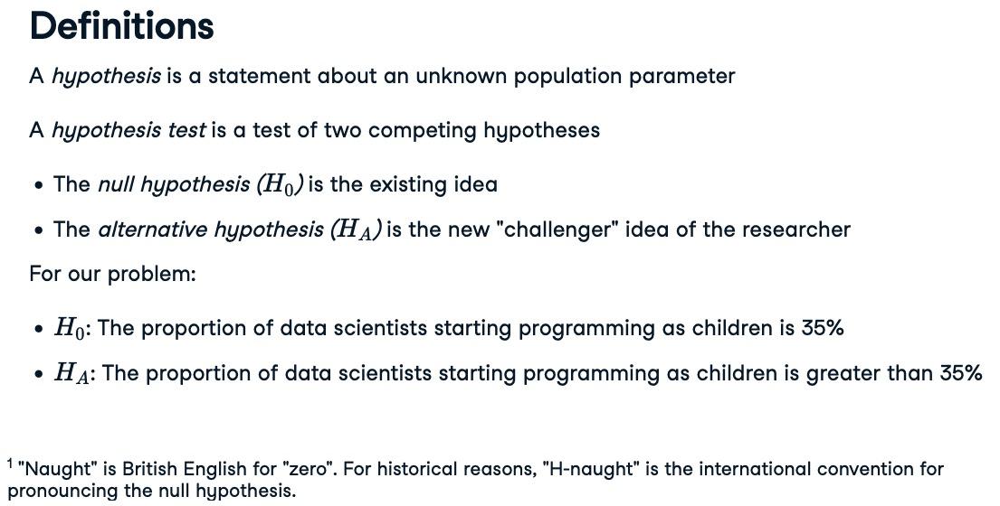

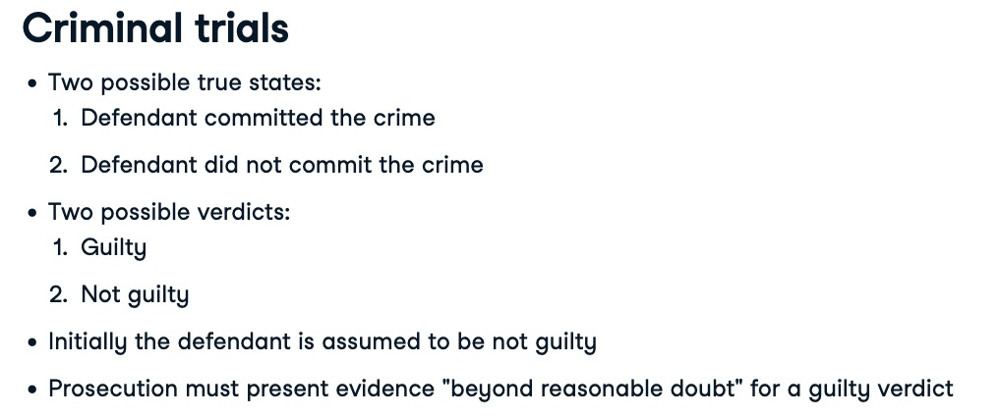

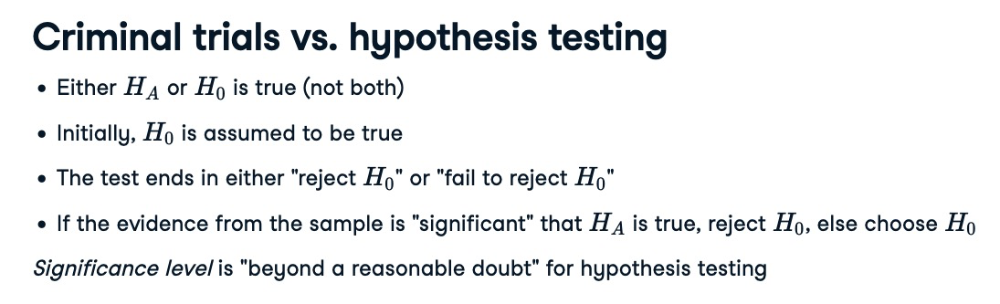

---
### One-tailed and two-tailed tests

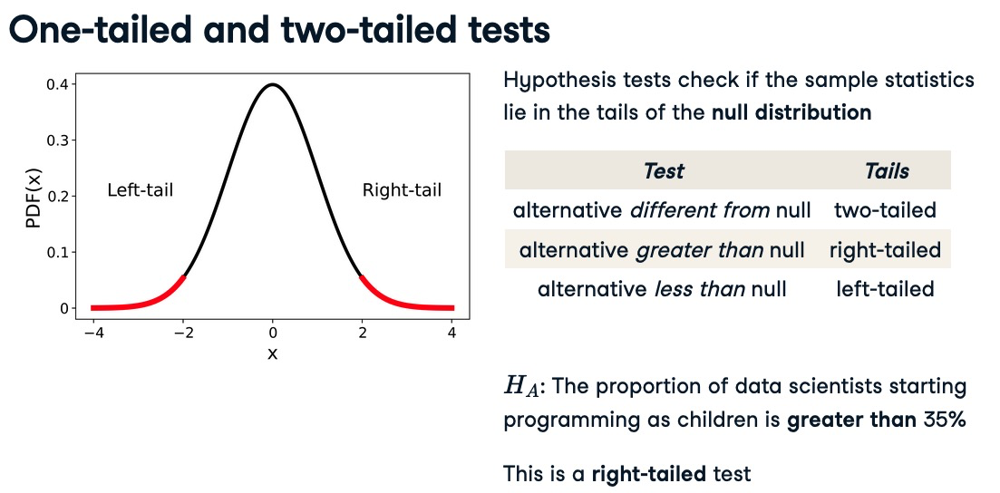

### `P-values measure the strength of support for the null hypothesis, or in other words, they measure the probability of obtaining a result, assuming the null hypothesis is true.`

- Large p-values mean our statistic is producing a result that is likely not in a tail of our null distribution, and chance could be a good explanation for the result. 

- Small p-values mean our statistic is producing a result likely in the tail of our null distribution. 

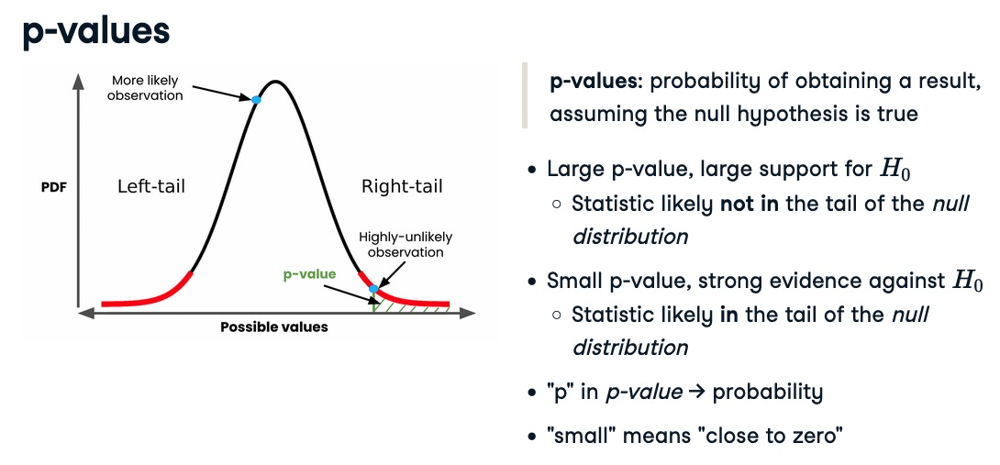

### `To calculate the P-value, we must first calculate the z-score.`

In [16]:
# We calculate the sample statistic, in this case the proportion of data scientists
# who started programming as children. 
prop_child_samp = (stack_overflow['age_first_code_cut']=='child').mean()

# The hypothesized value for the null hypothesis is 35%
prop_child_hyp = 0.35

# We get the standard error from the standard deviation of the bootstrap distribution 
first_code_boot_distn = []
for i in range(5000):
    first_code_boot_distn.append(
        # Step 2. Calculate point estimate 
        # Step 1. Resample
        (stack_overflow.sample(frac=1, replace=True)['age_first_code_cut']=='child').mean()
    )
    
prop_child_std_error = np.std(first_code_boot_distn, ddof=1)

# Get the z-score
prop_child_z_score = (prop_child_samp - prop_child_hyp) / prop_child_std_error
prop_child_z_score

3.993626177809491

### We pass the z-score to the standard normal CDF, with the default values of mean 0 and standard deviation of 1. As we are performing a `right-tailed test`, the P-value is calculated by taking `1 - norm.cdf(z_score, loc=0, scale=1)`

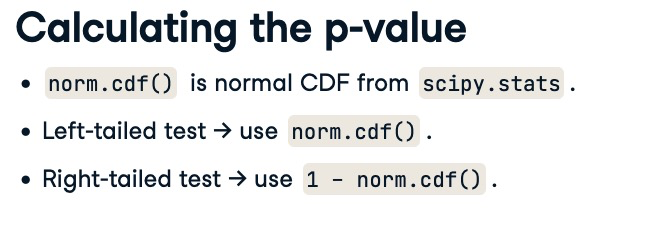

In [17]:
1 - norm.cdf(prop_child_z_score, loc=0, scale=1)

3.253521288038019e-05

---
### Exercise

---
## Statistical significance 

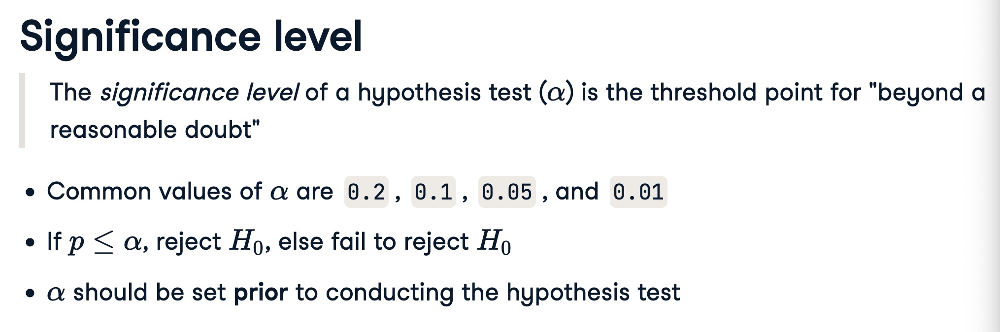

### `Workflow of calculating P-value`

- ### `Determine the significance level`

- ### `Calculate the sample mean`

- ### `Calculate the hypothesized mean`

- ### `Calculate the standard error based on the bootstrapped distribution`

- ### `Calculate z-score`

- ### `Calculate P-value`

---
### Confidence intervals 

`To get a sense of the potential values of the population parameter, it's common to choose a confidence interval level of one minus the significance level.`

`The interval provides a range of plausible values for the population proportion of data scientists that programmed as children.` 

In [18]:
first_code_lower = np.quantile(first_code_boot_distn, 0.025)
first_code_upper = np.quantile(first_code_boot_distn, 0.975)
print((first_code_lower, first_code_upper))

(0.37063246351172047, 0.41132242370632466)


### Type of errors 

- ### `False positives - Type I errors`

- ### `False negatives - Type II errors`

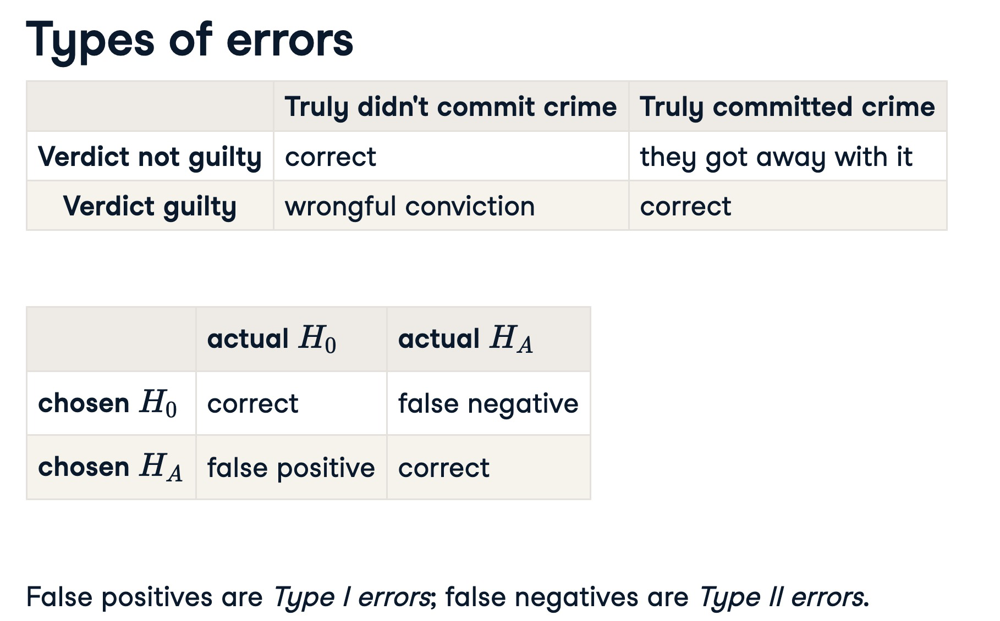

---
# 2. Two-sample and ANOVA Tests

## Performing t-tests

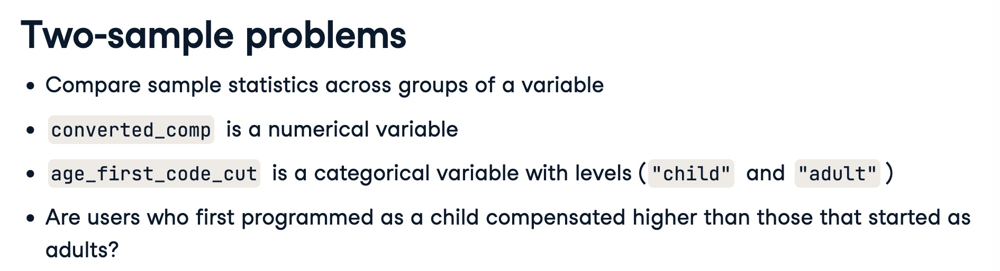

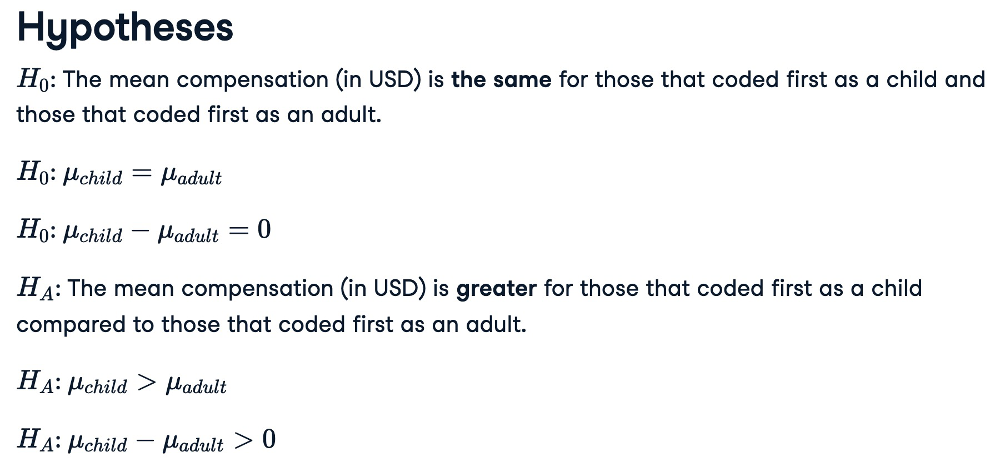

### Calculating groupwise summary statistics

`Is that increase statistically significant or could it be explained by sampling variability?`

In [19]:
stack_overflow.groupby('age_first_code_cut')['converted_comp'].mean()

age_first_code_cut
adult    111313.311047
child    132419.570621
Name: converted_comp, dtype: float64

### `When testing for differences between means, the test statistic is called 't' rather than 'z', and can be calculated using six numbers from the samples.`

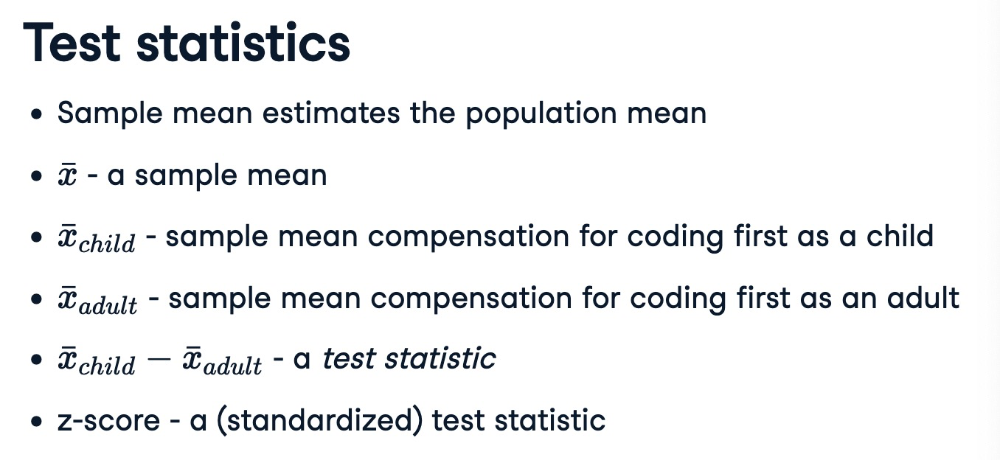

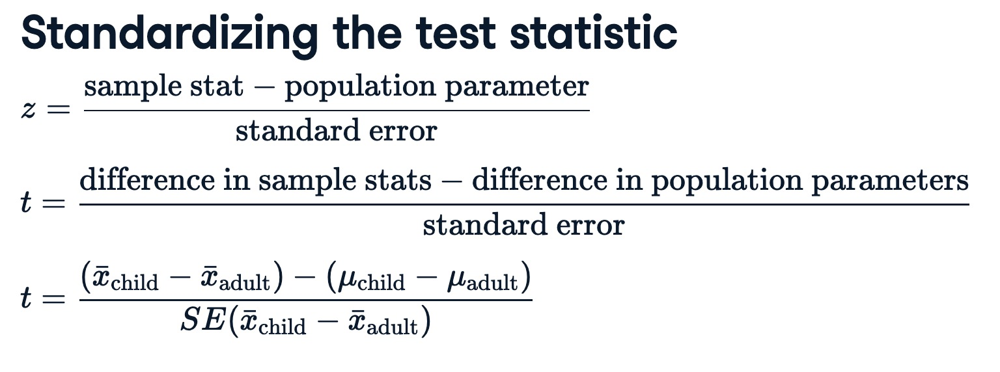

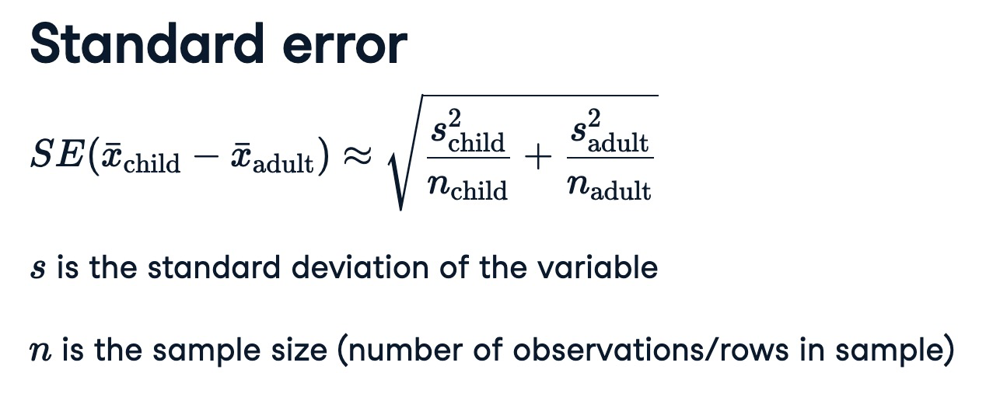

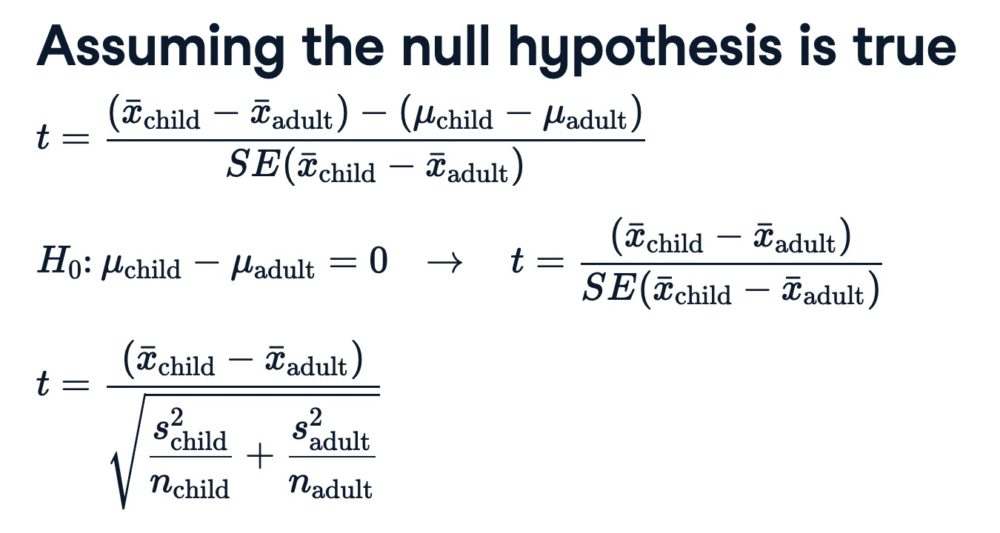

In [20]:
xbar = stack_overflow.groupby('age_first_code_cut')['converted_comp'].mean()
xbar

age_first_code_cut
adult    111313.311047
child    132419.570621
Name: converted_comp, dtype: float64

In [21]:
xbar_adult = xbar[0]
xbar_child = xbar[1]

In [22]:
s = stack_overflow.groupby('age_first_code_cut')['converted_comp'].std()
s

age_first_code_cut
adult    271546.521729
child    255585.240115
Name: converted_comp, dtype: float64

In [23]:
s_adult = s[0]
s_child = s[1]

In [24]:
n = stack_overflow.groupby('age_first_code_cut')['converted_comp'].count()

In [25]:
n_adult = n[0]
n_child = n[1]

### Calculating the test statistic

In [26]:
numerator = xbar_child - xbar_adult
denominator = np.sqrt(s_child ** 2 / n_child + s_adult ** 2 / n_adult)
t_stat = numerator / denominator
t_stat

1.8699313316221844

## Calculating P-values from t-statistics

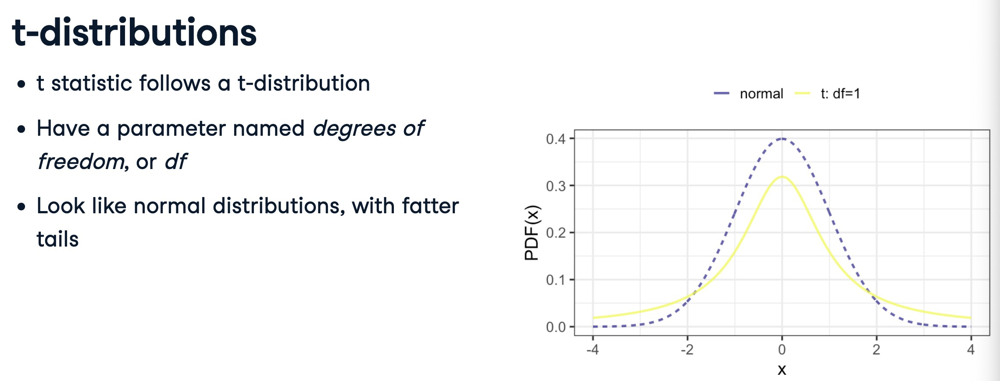

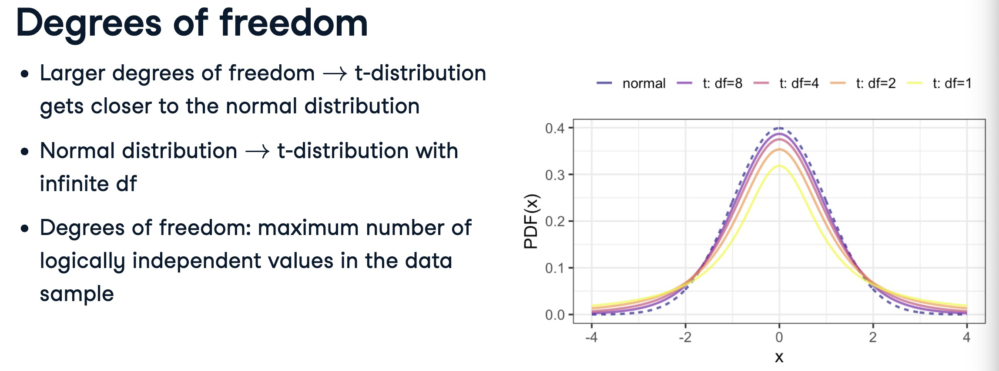

### `Understanding degrees of freedom`

In our two sample example, we use the number of observations minus two because we know two sample statistics, the mean for each group. 

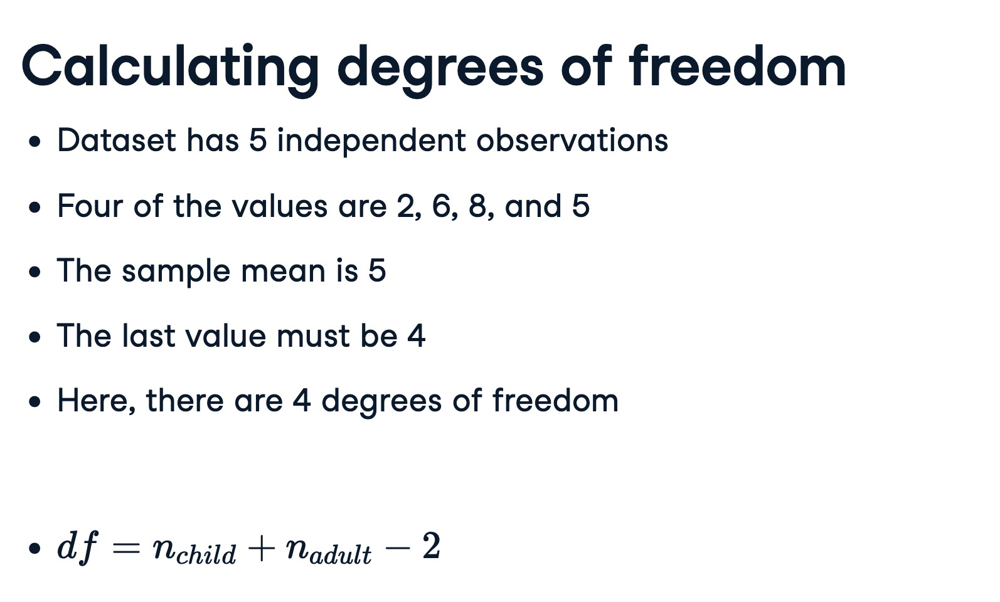

### `t-statistic versus z-statistic`

The t-distribution allows for more uncertainty when using multiple estimates in a single statistic calculation. Here, the multiple estimates correspond to the sample mean and the sample standard deviation. 

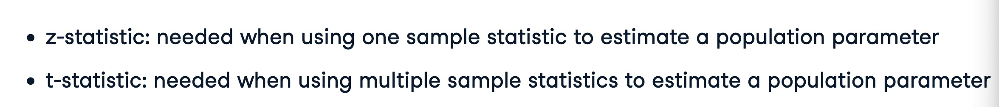

### Calculating P-values: two means from different groups

#### Determing a significance level = 0.1

#### `Use t-distribution CDF nor normal CDF`

In [27]:
degrees_of_freedom = n_child + n_adult - 2

1 - t.cdf(t_stat, df=degrees_of_freedom)

0.030811302165157595

#### `--> The P-value is smaller than 0.1, we reject the null hypothesis.`

---
## Paired t-tests

### US Republican presidents dataset

Each row represents county-level votes in a presidential election

In [28]:
sample_data = pd.read_feather(path + 'repub_votes_potus_08_12.feather')
sample_data

,state,county,repub_percent_08,repub_percent_12
0,Alabama,Hale,38.957877,37.139882
1,Arkansas,Nevada,56.726272,58.983452
2,California,Lake,38.896719,39.331367
3,California,Ventura,42.923190,45.250693
4,Colorado,Lincoln,74.522569,73.764757
...,...,...,...,...
95,Wisconsin,Burnett,48.342541,52.437478
96,Wisconsin,La Crosse,37.490904,40.577038
97,Wisconsin,Lafayette,38.104967,41.675050
98,Wyoming,Weston,76.684241,83.983328


### Hypotheses:

Question: Was the percentage of Republican candidate votes lower in 2008 than 2012?

$H_{0}: \mu_{2008} - \mu_{2012} = 0$

$H_{A}: \mu_{2008} - \mu_{2012} < 0$

Set $\alpha = 0.05$ significance level

### Data is paired:

One feature of this dataset is that the 2008 votes and the 2012 votes are paired, which means they aren't independent, since they both refer to the same county. This means voting patterns may occur due to county-level demographics and local politics, and we want to capture this pairing in our model.

### From two samples to one

For paired analysis, rather than considering the two variables separately, we can consider a single variable of the difference. 

In [29]:
sample_data['diff'] = sample_data['repub_percent_08'] - \
                      sample_data['repub_percent_12']

<Axes: >

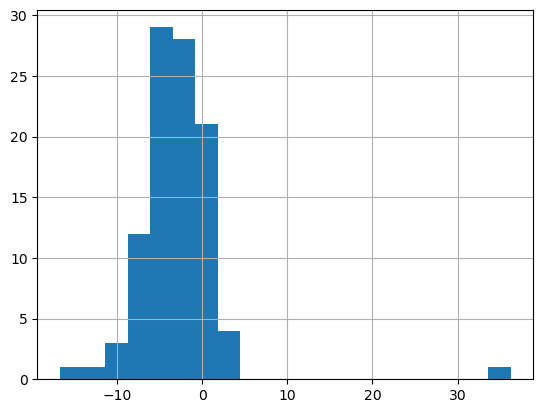

In [30]:
sample_data['diff'].hist(bins=20)

In this histogram of difference, most values are between -10 and 10, with at least one outlier. 

### Calculate sample statistics of the difference 

In [31]:
xbar_diff = sample_data['diff'].mean()
xbar_diff

-2.877109041242944

### Revised hypotheses:

We can restate the hypotheses in terms of the single population mean being equal or less than zero. 

**Old hypotheses:**

$H_{0}: \mu_{2008} - \mu_{2012} = 0$

$H_{A}: \mu_{2008} - \mu_{2012} < 0$

**New hypotheses:**

$H_{0}: \mu_{diff} = 0$

$H_{A}: \mu_{diff} < 0$

**The test statistic, t, has a slightly simpler equation compared to the two sample case. We have one statistic, so the number of degrees of freedom is the number of pairs minus one.**

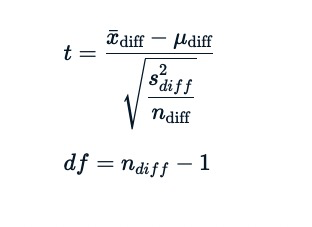

In [32]:
n_diff = len(sample_data)
s_diff = sample_data['diff'].std()
t_stat = (xbar_diff - 0) / np.sqrt(s_diff**2/n_diff)
t_stat

-5.601043121928489

In [33]:
degrees_of_freedom = n_diff - 1
p_value = t.cdf(t_stat, df=n_diff - 1)
p_value

9.572537285272413e-08

The P-value is really small. That means we reject the null hypothesis in favor of the alternative hypothesis that the Republican candidates got a smaller percentage of the vote in 2008 compared to 2012. 

### Testing differences between two means using `ttest()`

#### The [pingouin](https://pingouin-stats.org/build/html/index.html) package provides a variety of methods for hypothesis testing and returns the results as a pandas DataFrame. Its output can be a little friendlier to work with than similar methods from scipy.stats

In [34]:
# works with array-like data
# y specifies the null hypothesis
# the type of alternative hypothesis can be specified as two-sided, less, or greater

pingouin.ttest(x=sample_data['diff'], \
               y=0, \
               alternative='less')

/Users/wenwen/miniforge3/envs/env_tf/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:6826: RuntimeWarning: overflow encountered in _nct_cdf
  return np.clip(_boost._nct_cdf(x, df, nc), 0, 1)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.601043,99,less,9.572537e-08,"[-inf, -2.02]",0.560104,1.323e+05,0.999955


### `ttest()` with `paired=True`


In [35]:
pingouin.ttest(x=sample_data['repub_percent_08'], \
               y=sample_data['repub_percent_12'], \
               paired=True, \
               alternative='less')

/Users/wenwen/miniforge3/envs/env_tf/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:6826: RuntimeWarning: overflow encountered in _nct_cdf
  return np.clip(_boost._nct_cdf(x, df, nc), 0, 1)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.601043,99,less,9.572537e-08,"[-inf, -2.02]",0.217364,1.323e+05,0.696338


### Note that the first 4 columns of the output are identical with before. If we don't set paired=True and perform an unpaired t-test, then the numbers change. 

In [36]:
pingouin.ttest(x=sample_data['repub_percent_08'], \
               y=sample_data['repub_percent_12'], \
               paired=False, \
               alternative='less')

/Users/wenwen/miniforge3/envs/env_tf/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:6826: RuntimeWarning: overflow encountered in _nct_cdf
  return np.clip(_boost._nct_cdf(x, df, nc), 0, 1)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-1.536997,198,less,0.062945,"[-inf, 0.22]",0.217364,0.927,0.454972


### --> Performing an unpaired ttest when our data is paired increases the chances of False Negative errors. 

---
## ANOVA tests (what if there are more than two groups?)

### Job satisfaction: 5 categories

In [37]:
stack_overflow['job_sat'].value_counts()

Very satisfied           879
Slightly satisfied       680
Slightly dissatisfied    342
Neither                  201
Very dissatisfied        159
Name: job_sat, dtype: int64

Suppose we want to know if mean annual compensation is different for each of the levels of job satisfaction. 

### Visualizing multiple distributions

Is mean annual compensation different for different levels of job satisfaction?

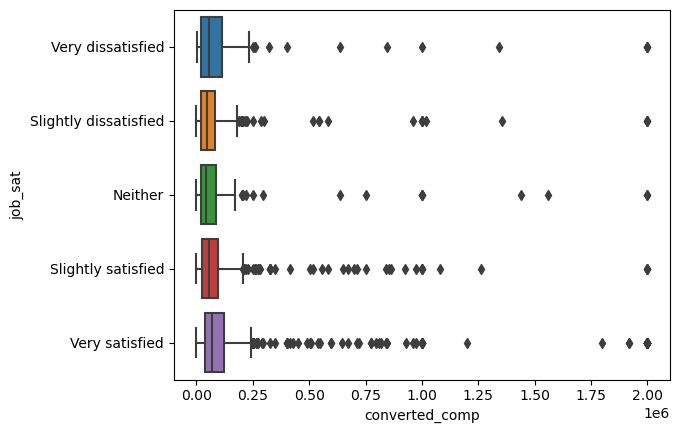

In [38]:
sns.boxplot(x='converted_comp',
            y='job_sat',
            data=stack_overflow)
plt.show()

### Analysis of variance (ANOVA)

A test for differences between groups 

$\alpha = 0.2$

In [39]:
pingouin.anova(data=stack_overflow,
               dv='converted_comp',
               between='job_sat')

,Source,ddof1,ddof2,F,p-unc,np2
0,job_sat,4,2256,4.480485,0.001315,0.007882


The p-value is smaller than $\alpha$, that means at least two categories have significantly different compensation, but this doesn't tell us which two categories they are. 

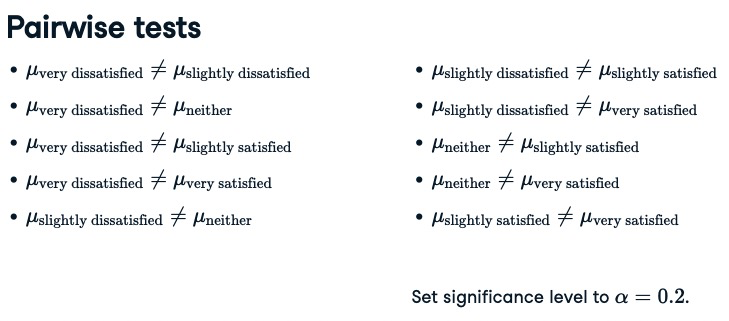

To run these paired tests in one go, we can use `pairwise_tests`

In [40]:
pingouin.pairwise_tests(data=stack_overflow,
                        dv='converted_comp',
                        between='job_sat',
                        padjust='none')

/Users/wenwen/miniforge3/envs/env_tf/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:6832: RuntimeWarning: overflow encountered in _nct_sf
  return np.clip(_boost._nct_sf(x, df, nc), 0, 1)
/Users/wenwen/miniforge3/envs/env_tf/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:6826: RuntimeWarning: overflow encountered in _nct_cdf
  return np.clip(_boost._nct_cdf(x, df, nc), 0, 1)
/Users/wenwen/miniforge3/envs/env_tf/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:6832: RuntimeWarning: overflow encountered in _nct_sf
  return np.clip(_boost._nct_sf(x, df, nc), 0, 1)
/Users/wenwen/miniforge3/envs/env_tf/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:6826: RuntimeWarning: overflow encountered in _nct_cdf
  return np.clip(_boost._nct_cdf(x, df, nc), 0, 1)


,Contrast,A,B,Paired,Parametric,T,dof,alternative,p-unc,BF10,hedges
0,job_sat,Slightly satisfied,Very satisfied,False,True,-4.009935,1478.622799,two-sided,0.000064,158.564,-0.192931
1,job_sat,Slightly satisfied,Neither,False,True,-0.700752,258.204546,two-sided,0.484088,0.114,-0.068513
2,job_sat,Slightly satisfied,Very dissatisfied,False,True,-1.243665,187.153329,two-sided,0.215179,0.208,-0.145624
3,job_sat,Slightly satisfied,Slightly dissatisfied,False,True,-0.038264,569.926329,two-sided,0.969491,0.074,-0.002719
4,job_sat,Very satisfied,Neither,False,True,1.662901,328.326639,two-sided,0.097286,0.337,0.120115
5,job_sat,Very satisfied,Very dissatisfied,False,True,0.747379,221.666205,two-sided,0.455627,0.126,0.063479
6,job_sat,Very satisfied,Slightly dissatisfied,False,True,3.076222,821.303063,two-sided,0.002166,7.43,0.173247
7,job_sat,Neither,Very dissatisfied,False,True,-0.545948,321.165726,two-sided,0.585481,0.135,-0.058537
8,job_sat,Neither,Slightly dissatisfied,False,True,0.602209,367.730081,two-sided,0.547406,0.118,0.055707
9,job_sat,Very dissatisfied,Slightly dissatisfied,False,True,1.129951,247.570187,two-sided,0.259590,0.197,0.119131


### The more tests we run, the higher the chance that at least one of them will give a False Positive significant result. With a significance level of 0.2, if we run one test, the chance of a False Positive result is 0.2. With 5 groups and 10 tests, the probability of at least one False Positive is around 0.7. With 20 groups, it's almost guaranteed that we will get at least one False Positive.  <span style='color:red'>(Should revisit.)</span>

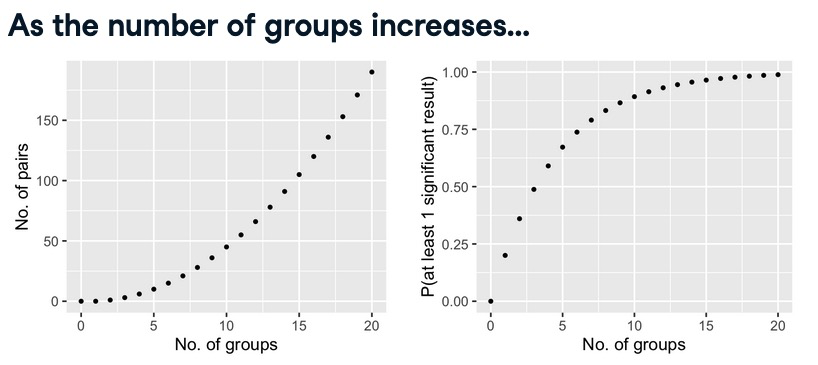

### The solution to this is to apply an adjustment to increase the p-values, reducing the chance of getting a False Positive. One common adjustment is the `Bonferroni correction`.

In [41]:
pingouin.pairwise_tests(data=stack_overflow,
                        dv='converted_comp',
                        between='job_sat',
                        padjust='bonf')

/Users/wenwen/miniforge3/envs/env_tf/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:6832: RuntimeWarning: overflow encountered in _nct_sf
  return np.clip(_boost._nct_sf(x, df, nc), 0, 1)
/Users/wenwen/miniforge3/envs/env_tf/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:6826: RuntimeWarning: overflow encountered in _nct_cdf
  return np.clip(_boost._nct_cdf(x, df, nc), 0, 1)
/Users/wenwen/miniforge3/envs/env_tf/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:6832: RuntimeWarning: overflow encountered in _nct_sf
  return np.clip(_boost._nct_sf(x, df, nc), 0, 1)
/Users/wenwen/miniforge3/envs/env_tf/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:6826: RuntimeWarning: overflow encountered in _nct_cdf
  return np.clip(_boost._nct_cdf(x, df, nc), 0, 1)


,Contrast,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,job_sat,Slightly satisfied,Very satisfied,False,True,-4.009935,1478.622799,two-sided,0.000064,0.000638,bonf,158.564,-0.192931
1,job_sat,Slightly satisfied,Neither,False,True,-0.700752,258.204546,two-sided,0.484088,1.000000,bonf,0.114,-0.068513
2,job_sat,Slightly satisfied,Very dissatisfied,False,True,-1.243665,187.153329,two-sided,0.215179,1.000000,bonf,0.208,-0.145624
3,job_sat,Slightly satisfied,Slightly dissatisfied,False,True,-0.038264,569.926329,two-sided,0.969491,1.000000,bonf,0.074,-0.002719
4,job_sat,Very satisfied,Neither,False,True,1.662901,328.326639,two-sided,0.097286,0.972864,bonf,0.337,0.120115
5,job_sat,Very satisfied,Very dissatisfied,False,True,0.747379,221.666205,two-sided,0.455627,1.000000,bonf,0.126,0.063479
6,job_sat,Very satisfied,Slightly dissatisfied,False,True,3.076222,821.303063,two-sided,0.002166,0.021659,bonf,7.43,0.173247
7,job_sat,Neither,Very dissatisfied,False,True,-0.545948,321.165726,two-sided,0.585481,1.000000,bonf,0.135,-0.058537
8,job_sat,Neither,Slightly dissatisfied,False,True,0.602209,367.730081,two-sided,0.547406,1.000000,bonf,0.118,0.055707
9,job_sat,Very dissatisfied,Slightly dissatisfied,False,True,1.129951,247.570187,two-sided,0.259590,1.000000,bonf,0.197,0.119131


### --> Looking at the `p-corr` column corresponding to corrected P-values, as opposed to the `p-unc` column for uncorrected, only two of the pairs appear to have significant differences. 

### `pingouin` provides several options for adjusting the p-values with some being more conservative than others. No adjustment with `none` is the default, but in almost all pairwise t-testing situations choosing a correction method is more appropriate. 

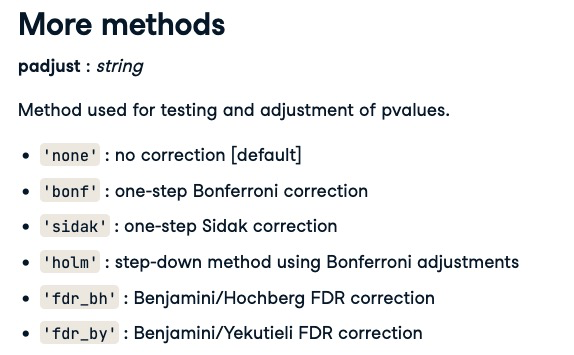

---
# 3. Proportion Tests

---
## One-sample proportion tests 

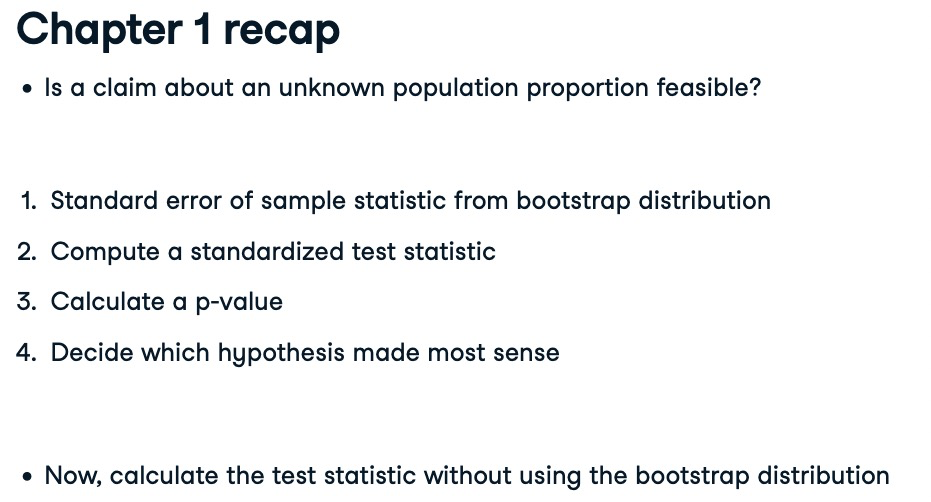

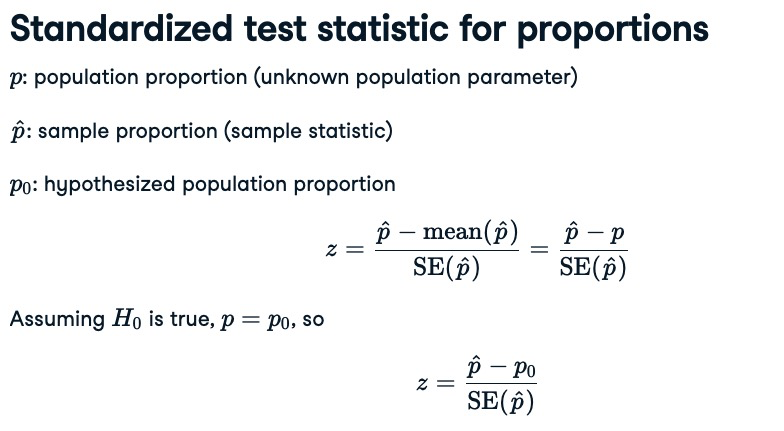

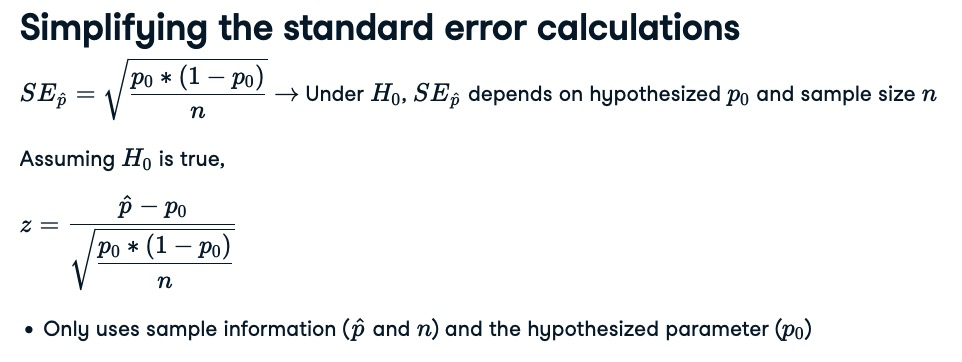

### `The standard deviation of the sample, s, is calculated from the sample mean, x_bar. That means that x_bar is used in the numerator to estimate the population mean, and in the denominator to estimate the population standard deviation. This dual usage increases the uncertainty in our estimate of the population parameter.`

### `Since t-distributions are effectively a normal distribution with fatter tails, we can use them to account for this extra uncertainty. In effect, the t-distribution provides extra caution against mistakenly rejecting the null hypothesis. For proportions, we only use $\hat{p}$ in the numerator, thus avoiding the problem with uncertainty, and a z-distribution is fine.`

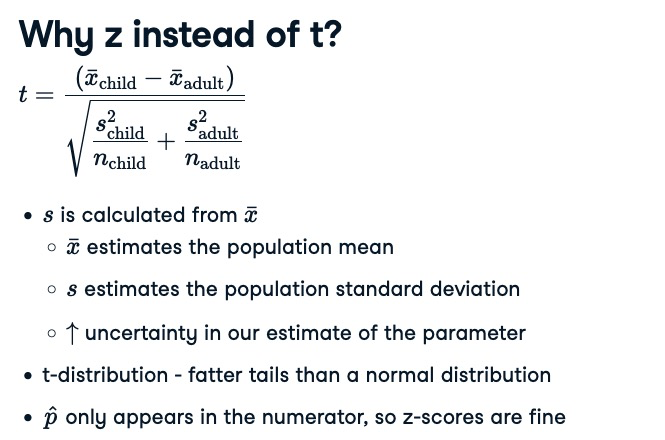

---
### Stack Overflow age categories 

$H_{0}:$ Proportion of Stack Overflow users under thirty $ = 0.5$

$H_{A}:$ Proportion of Stack Overflow users under thirty $ \neq 0.5$

In [42]:
alpha = 0.01
stack_overflow['age_cat'].value_counts(normalize=True)

Under 30       0.535604
At least 30    0.464396
Name: age_cat, dtype: float64

#### Variables for z

In [43]:
# p_hat is the proportion of sample rows where age_cut equals 'Under 30'
p_hat = (stack_overflow['age_cat'] == 'Under 30').mean()
p_hat

0.5356037151702786

In [44]:
# p_0 is 0.5 according to the null hypothesis
p_0 = 0.5

In [45]:
# n is the number of rows in the dataset 
n = len(stack_overflow)
n

2261

#### Calculating the z-score

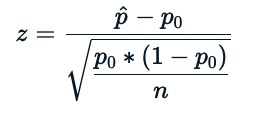

In [46]:
numerator = p_hat - p_0
denominator = np.sqrt(p_0 * (1 - p_0) / n)
z_score = numerator / denominator 
z_score

3.385911440783663

#### Calculating the P-value

`Left-tailed: p_value = norm.cdf(z_score)` 

`Right-tailed: p_value = 1 - norm.cdf(z_score)`

`Two-tailed: p_value = norm.cdf(-z_score) + 1 - norm.cdf(z_score) = 2 * (1 - norm.cdf(z_score))`

In [47]:
p_value = 2 *  (1 - norm.cdf(z_score))
p_value

0.0007094227368100725

#### --> Here, the P-value is less than the significance level, so we reject the null hypothesis, concluding that the proportion of users under 30 is not equal to 0.5.

### Take-home:

While bootstrapping can be used to estimate the standard error of any statistic, it is computationally intensive. For proportions, using a simple equation of the hypothesized proportion and sample size is easier to compute.

---
## Two-sample proportion tests 

### Comparing two proportions

$H_{0}:$ Proportion of hobbyist users is the same for those under 30 as those at least 30

$H_{0}: p_{\geq 30} - p_{\leq 30} = 0$

$H_{A}:$ Proportion of hobbyist users is different for those under 30 to those at least 30 

$H_{A}: p_{\geq 30} - p_{\leq 30} \neq 0$

alpha = 0.05

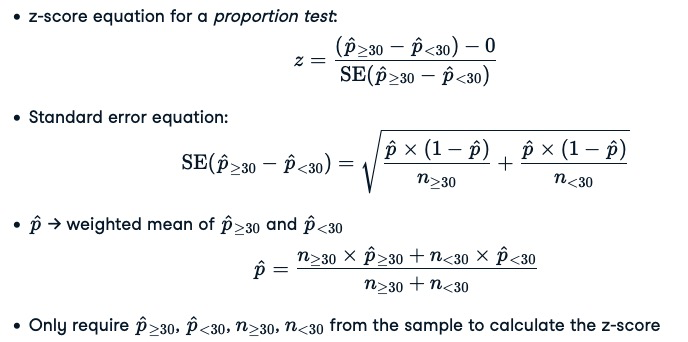

$\hat{p}$ is a weighted mean of the sample proportions for each category, also is known as a pooled estimate of the population proportion. 

In [48]:
p_hats = stack_overflow.groupby('age_cat')['hobbyist'].value_counts(normalize=True)
p_hats

age_cat      hobbyist
At least 30  Yes         0.773333
             No          0.226667
Under 30     Yes         0.843105
             No          0.156895
Name: hobbyist, dtype: float64

In [49]:
n = stack_overflow.groupby('age_cat')['hobbyist'].count()
n

age_cat
At least 30    1050
Under 30       1211
Name: hobbyist, dtype: int64

In [50]:
p_hat_at_least_30 = p_hats[('At least 30', 'Yes')]
p_hat_under_30 = p_hats[('Under 30', 'Yes')]
print(p_hat_at_least_30, p_hat_under_30)

0.7733333333333333 0.8431048720066061


In [51]:
n_at_least_30 = n['At least 30']
n_under_30 = n['Under 30']
print(n_at_least_30, n_under_30)

1050 1211


### Getting the numbers for the z-score

In [52]:
p_hat = (n_at_least_30 * p_hat_at_least_30 + n_under_30 * p_hat_under_30) / (n_at_least_30 + n_under_30)
    
std_error = np.sqrt(p_hat * (1-p_hat) / n_at_least_30 + p_hat * (1-p_hat) / n_under_30)

z_score = (p_hat_at_least_30 - p_hat_under_30) / std_error

print(z_score)

-4.223691463320559


### Proportion tests using `proportions_ztest()`

The `proportions_ztest` function from `statsmodels` can calculate the z-score more directly. 

This function requires two objects as Numpy arrays: the number of hobbyist in each age group, and the total number of rows in each age group. 

In [53]:
stack_overflow.groupby('age_cat')['hobbyist'].value_counts()

age_cat      hobbyist
At least 30  Yes          812
             No           238
Under 30     Yes         1021
             No           190
Name: hobbyist, dtype: int64

In [54]:
n_hobbyists = np.array([812, 1021])
n_rows = np.array([812 + 238, 1021 + 190])

In [55]:
z_score, p_value = proportions_ztest(count=n_hobbyists, nobs=n_rows, alternative='two-sided')

In [56]:
z_score, p_value

(-4.223691463320559, 2.403330142685068e-05)

#### --> The P-value is smaller than the significance level that we set, so we conclude that there is a difference in the proportion of hobbyists between the two age groups. 

---
## Chi-square test of independence 

### `Extend proportion test to more than two groups`

### Independence of variables

Previous hypothesis test results suggest that `hobbyist` and `age_cat` are associated. If the proportion of hobbyists was the same for each age group, the variables would be considered statistically independent. 

**Statistical independence:**

More formally, two categorical variables are considered **statistically independent** when the proportion of successes in the response variable is the same across all categories of the explanatory variable. 

### The `pingouin` package has an indirect way of testing the difference in the proportions from the previous lecture. 

The `correction` argument specifies whether or not to apply Yates' continuity correcton, which is a fudge factor for when the sample size is very small and the degrees of freedom is 1. 

The method returns 3 pandas dataframes: the expected counts, the observed counts, and statistics related to the test.

In [57]:
expected, observed, stats = pingouin.chi2_independence(data=stack_overflow,\
                                                       x='hobbyist',\
                                                       y='age_cat',\
                                                       correction=False)
print(stats)

                 test    lambda       chi2  dof      pval    cramer     power
0             pearson  1.000000  17.839570  1.0  0.000024  0.088826  0.988205
1        cressie-read  0.666667  17.818114  1.0  0.000024  0.088773  0.988126
2      log-likelihood  0.000000  17.802653  1.0  0.000025  0.088734  0.988069
3       freeman-tukey -0.500000  17.815060  1.0  0.000024  0.088765  0.988115
4  mod-log-likelihood -1.000000  17.848099  1.0  0.000024  0.088848  0.988236
5              neyman -2.000000  17.976656  1.0  0.000022  0.089167  0.988694


/Users/wenwen/miniforge3/envs/env_tf/lib/python3.9/site-packages/scipy/_lib/_util.py:69: RuntimeWarning: overflow encountered in _ncx2_sf
  np.place(out, cond, f(*temp))


#### Focusing on the pearson test row and `chi2` and `pval` columns

The P-value is the same as we had with the z-test of around 0.000024. The `chi2` value is the squared result of the z-score. 

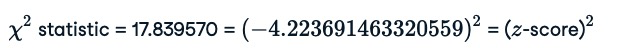

---
### Another example: job satisfaction and age category

In [58]:
stack_overflow['age_cat'].value_counts()

Under 30       1211
At least 30    1050
Name: age_cat, dtype: int64

In [59]:
stack_overflow['job_sat'].value_counts()

Very satisfied           879
Slightly satisfied       680
Slightly dissatisfied    342
Neither                  201
Very dissatisfied        159
Name: job_sat, dtype: int64

### Declaring the hypotheses to test for independence of these variables

Here, `age_cat` is the response variable, and `job_sat` is the explanatory variable. 

$H_{0}:$ Age categories are independent of job satisfaction levels 

$H_{A}:$ Age categories are not independent of job satisfaction levels

alpha = 0.1

Test statistic denoted $\chi^2$ - it quantifies how far away the observed results are from the expected values if independence was true. 

### Exploratory visualization: proportional stacked bar plot

<Axes: xlabel='job_sat'>

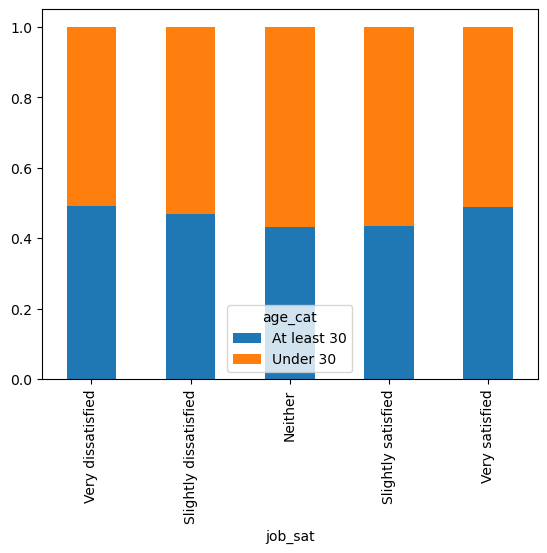

In [60]:
props = stack_overflow.groupby('job_sat')['age_cat'].value_counts(normalize=True)
wide_props = props.unstack()
wide_props.plot(kind='bar', stacked=True)

If the `age_cat` was independent of `job_sat`, the split between the age categories would be at the same height in each of the five bars. There is variation shown in the plot. We will need a chi-square independence test to determine whether it's a significant difference.  

### Chi-square independence test

We use the correction here (default `correction=True`) because our degrees of freedom is 4, calculated by subtracting 1 from each of the variable categories and multiplying. 

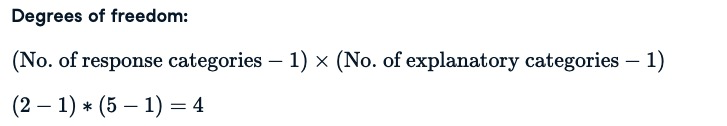

In [61]:
expected, observed, stats = pingouin.chi2_independence(data=stack_overflow,\
                                                       x='job_sat',\
                                                       y='age_cat')
print(stats)

                 test    lambda      chi2  dof      pval    cramer     power
0             pearson  1.000000  5.552373  4.0  0.235164  0.049555  0.437417
1        cressie-read  0.666667  5.554106  4.0  0.235014  0.049563  0.437545
2      log-likelihood  0.000000  5.558529  4.0  0.234632  0.049583  0.437871
3       freeman-tukey -0.500000  5.562688  4.0  0.234274  0.049601  0.438178
4  mod-log-likelihood -1.000000  5.567570  4.0  0.233854  0.049623  0.438538
5              neyman -2.000000  5.579519  4.0  0.232828  0.049676  0.439419


/Users/wenwen/miniforge3/envs/env_tf/lib/python3.9/site-packages/scipy/_lib/_util.py:69: RuntimeWarning: overflow encountered in _ncx2_sf
  np.place(out, cond, f(*temp))


#### The P-value is 0.23, which is above the significance level that we set, so we conclude that age categories are independent of job satisfaction. 

### Swapping the variables?


<Axes: xlabel='age_cat'>

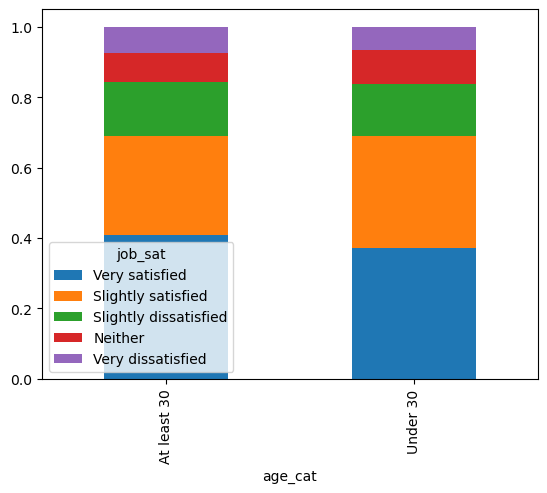

In [62]:
props = stack_overflow.groupby('age_cat')['job_sat'].value_counts(normalize=True)
wide_props = props.unstack()
wide_props.plot(kind='bar', stacked=True)

### Chi-square both ways

If we run the chi-square test with the variables swapped, then the results are identical. 

In [63]:
expected, observed, stats = pingouin.chi2_independence(data=stack_overflow,\
                                                       x='age_cat',\
                                                       y='job_sat')
print(stats[stats['test'] == 'pearson'])

/Users/wenwen/miniforge3/envs/env_tf/lib/python3.9/site-packages/scipy/_lib/_util.py:69: RuntimeWarning: overflow encountered in _ncx2_sf
  np.place(out, cond, f(*temp))


      test  lambda      chi2  dof      pval    cramer     power
0  pearson     1.0  5.552373  4.0  0.235164  0.049555  0.437417


#### Because of this, we phrase our questions as `Are the variables X and Y independent?`, not `Is variable X independent from variable Y?`, because the order doesn't matter. 

### What about direction and tails?

We didn't care about tails in this test. In fact, the chi2_independence method doesn't have an `alternative` argument. This is because the chi-square test statistic is based on the square of observed and expected counts, and square numbers are non-negative. **That means chi-square tests tend to be right-tailed tests.**

Note: left-tailed chi-square tests are used in statistical forensics to detect if a fit is suspiciously good because the data was fabricated. Chi-square tests of variance can be two-sided. These are niche uses.

---
### Chi-square distribution versus normal distribution 

Like the t-distribution, the chi-square distribution has `degrees of freedom` and `non-centrality`parameters. When these numbers are large, the chi-square distribution can be approximated by a normal distribution.

---
## Chi-square goodness of fit tests 

### `Compare a single categorical variable to a hypothesized distribution.`

### Purple links in stack_overflow 

> How do you feel when you discover that you've already visited the top resource?

In [64]:
purple_link_counts = stack_overflow['purple_link'].value_counts()
purple_link_counts

Hello, old friend    1225
Indifferent           405
Amused                368
Annoyed               263
Name: purple_link, dtype: int64

A bit manipulation:
- Rename the leftmost column to be purple_link

- Assign the counts to n

- Sort by purple_link

In [65]:
purple_link_counts = purple_link_counts.rename_axis('purple_link')\
                                       .reset_index(name='n')\
                                       .sort_values('purple_link')
purple_link_counts

,purple_link,n
2,Amused,368
3,Annoyed,263
0,"Hello, old friend",1225
1,Indifferent,405


### Declaring the hypotheses 

Half of the users in the population wouild respond "Hello, old friend", and the other three responses would get 1/6 each. 

$H_{0}:$ The sample matches the hypothesized distribution 

$H_{A}:$ The sample does not match the hypothesized distribution

$\chi^2$ measures how far observed results are from expectations in each group

alpha = 0.01

In [66]:
hypothesized = pd.DataFrame({
    'purple_link': ['Amused', 'Annoyed', 'Hello, old friend', 'Indifferent'],
    'prop': [1/6, 1/6, 1/2, 1/6]})

hypothesized

,purple_link,prop
0,Amused,0.166667
1,Annoyed,0.166667
2,"Hello, old friend",0.500000
3,Indifferent,0.166667


### Hypothesized counts by category 

To visualize the purple_link distribution, it will help to have the hypothesized counts for each answer.

In [67]:
n_total = len(stack_overflow)
hypothesized['n'] = hypothesized['prop'] * n_total
hypothesized

,purple_link,prop,n
0,Amused,0.166667,376.833333
1,Annoyed,0.166667,376.833333
2,"Hello, old friend",0.500000,1130.500000
3,Indifferent,0.166667,376.833333


### Visualizing counts

How well the hypothesized counts appear to model the observed counts?

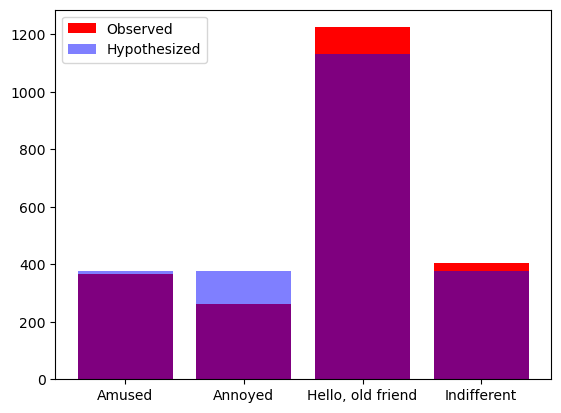

In [68]:
plt.bar(purple_link_counts['purple_link'], purple_link_counts['n'],
       color='red', label='Observed')

plt.bar(hypothesized['purple_link'], hypothesized['n'], alpha=0.5,
        color='blue', label='Hypothesized')

plt.legend()
plt.show()

We will run a test to see whether the difference between the observed and the hypothesized is statistically different.

### Chi-square goodness of fit test

The one-sample chi-square test is called a goodness of fit test, as we're testing how well our hypothesized data fits the observed data. 

Use `chisquare` method from `scipy.stats`

In [69]:
chisquare(f_obs=purple_link_counts['n'], f_exp=hypothesized['n'])

Power_divergenceResult(statistic=44.59840778416629, pvalue=1.1261810719413759e-09)

The P-value is very small, so we conclude the sample distribution of proportions is different from the hypothesized distribution. 

---
# 4. Non-Parametric Tests

---
## Assumptions in hypothesis testing 

Each hypothesis test we've seen so far makes assumptions about the data. It's only when these assumptions are met that it is appropriate to use that hypothesis test. 

### Randomness
**Assumption:**

Whether it uses one or multiple samples, every hypothesis test assumes that each sample is randomly sourced from its population. 

**Consequence:**

If we don't have a random sample, then it won't be representative of the population. 

**How to check this:**

To check this assumption, we need to know where our data came from. Ask the people invovled in data collection, or a domain expert that understands the population being sampled. 

---
### Independence of observations 
**Assumption:**

Tests also assume that each observation is independent. 

There are special cases like paired t-tests where dependencies between two samples are allowed, but these change the calculations, so we need to understand where such dependencies occur. 

**Consequence:**

As we saw from the paired t-test, not accounting for dependencies results in an increased chance of false negative and false positive errors. 

Not accounting for dependencies is a difficult problem to diagnoise during analysis. Ideally, it needs to be discussed before data collection. 

**How to check this:**

Understand how data was collected 

---
### Large sample size

**Assumption:**

Hypothesis tests also assume that our sample is large enough to mitigate uncertainty, so that the Central Limit Theorem applies, and the sample distribution can be assumed to be normally distributed. 

Smaller samples incur greater uncertainty, which may mean that the Central Limit Theorem does not apply and the sampling distribution might not be normally distributed. 

**Consequence:**

The increased uncertainty of a small sample means we get wider confidence intervals on the parameter we are trying to estimate. 

If the Central Limit Theorem does not apply, the calculations on the sample, and any conclusions drawn from them, could be nonsense, which increases the chance of false negative and false positive errors. 

**How to check this:**

How big our sample needs to be to be "big enough" depends on the test. 

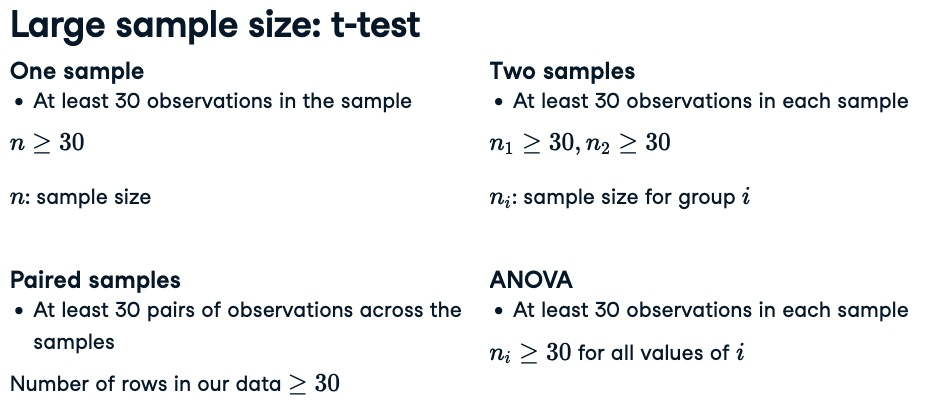

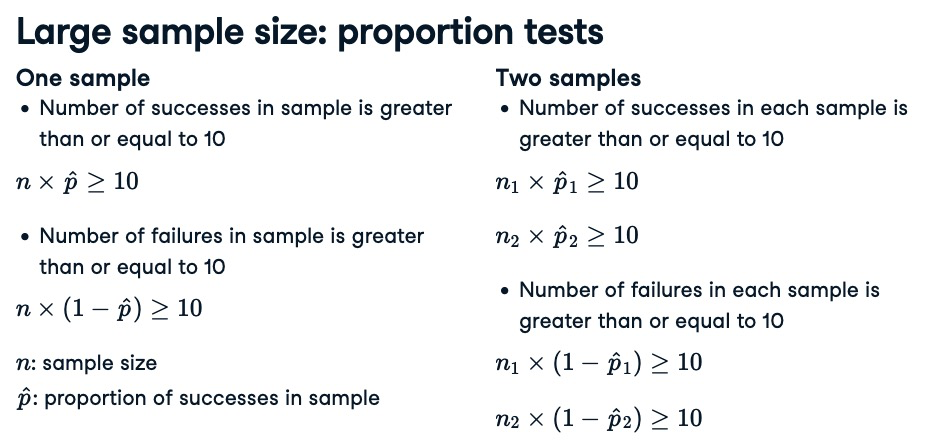

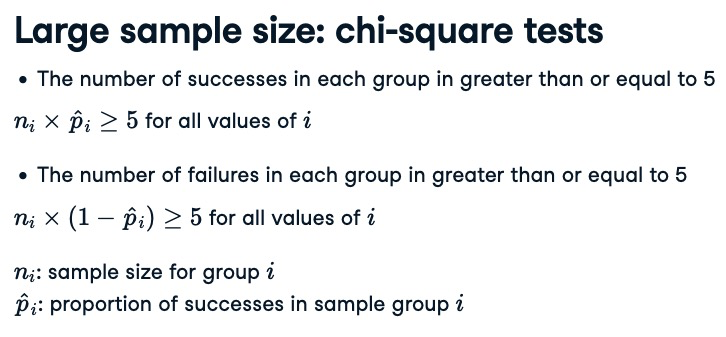

---
### Sanity check

> If the bootstrap distribution doesn't look normal, assumptions likely aren't valid. If that's the case, revisit data collection to check for **randomness**, **independence**, and **sample size**.

---
## Non-parametric tests 

### Parametric tests

- `z-test`, `t-test`, and `ANOVA` are all parametric tests

- Assume a normal distribution 

- Require sufficiently large sample sizes

### Smaller Republican votes data

In [70]:
repub_votes_small = sample_data[['state', \
                                 'county', \
                                 'repub_percent_08',\
                                 'repub_percent_12']].sample(n=5)
repub_votes_small

,state,county,repub_percent_08,repub_percent_12
78,Texas,Lampasas,74.024103,78.026097
33,Kentucky,Powell,57.059533,61.727293
32,Kentucky,Jessamine,67.829227,68.981728
38,Maine,Androscoggin,41.332726,42.056676
63,Ohio,Jackson,58.736511,59.068829


### Paired t-test on this small sample 

`Recall that at least 30 pairs of observations across the samples are needed.`

alpha = 0.01

In [71]:
pingouin.ttest(x=repub_votes_small['repub_percent_08'],
               y=repub_votes_small['repub_percent_12'],
               paired=True,
               alternative='less')

,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.425075,4,less,0.036182,"[-inf, -0.26]",0.168839,3.415,0.09238


The small P-value indicates we should reject the null hypothesis, leading us to suspect that the 2008 election had a smaller percentage of Republican votes than the 2012 election. 


### Non-parametric tests 

- Non-parametric tests avoid the parametric assumptions and conditions 

- Many non-parametric tests use `ranks` of the data

- Non-parametric tests are more reliable than parametric tests for **small sample sizes** and when data **isn't normally distributed**

### Wilcoxon-signed rank test (`non parametric version of paired t-test`)

- Developed by Frank Wilcoxon in 1945

- One of the first non-parametric procedures

- Works on the ranked absolute differences between the pairs of data

### `Step 1`

Take the difference on the paired values

In [72]:
repub_votes_small['diff'] = repub_votes_small['repub_percent_08'] - repub_votes_small['repub_percent_12']
print(repub_votes_small)

       state        county  repub_percent_08  repub_percent_12      diff
78     Texas      Lampasas         74.024103         78.026097 -4.001994
33  Kentucky        Powell         57.059533         61.727293 -4.667760
32  Kentucky     Jessamine         67.829227         68.981728 -1.152501
38     Maine  Androscoggin         41.332726         42.056676 -0.723950
63      Ohio       Jackson         58.736511         59.068829 -0.332318


### `Step 2`

Take the absolute value of the differences

In [73]:
repub_votes_small['abs_diff'] = repub_votes_small['diff'].abs()
print(repub_votes_small)

       state        county  repub_percent_08  repub_percent_12      diff  \
78     Texas      Lampasas         74.024103         78.026097 -4.001994   
33  Kentucky        Powell         57.059533         61.727293 -4.667760   
32  Kentucky     Jessamine         67.829227         68.981728 -1.152501   
38     Maine  Androscoggin         41.332726         42.056676 -0.723950   
63      Ohio       Jackson         58.736511         59.068829 -0.332318   

    abs_diff  
78  4.001994  
33  4.667760  
32  1.152501  
38  0.723950  
63  0.332318  


### `Step 3`

Rank these absolute differences using the `rankdata` method from `scipy.stats`

In [74]:
repub_votes_small['rank_abs_diff'] = rankdata(repub_votes_small['abs_diff'])
print(repub_votes_small)

       state        county  repub_percent_08  repub_percent_12      diff  \
78     Texas      Lampasas         74.024103         78.026097 -4.001994   
33  Kentucky        Powell         57.059533         61.727293 -4.667760   
32  Kentucky     Jessamine         67.829227         68.981728 -1.152501   
38     Maine  Androscoggin         41.332726         42.056676 -0.723950   
63      Ohio       Jackson         58.736511         59.068829 -0.332318   

    abs_diff  rank_abs_diff  
78  4.001994            4.0  
33  4.667760            5.0  
32  1.152501            3.0  
38  0.723950            2.0  
63  0.332318            1.0  


### `Step 4`

Calculating a test statistic called `W`. `W` uses the signs of the `diff` column to split the ranks into two groups: one for rows with negative differences and one for positive differences. 

`T_minus` is defined as the sum of the ranks with negative differences, and `T_plus` is the sume of the ranks with positive differences. 

The test statistic `W` is the smaller of `T_minus` and `T_plus`.

In [75]:
T_minus = 3 + 4+ 1+ 2 + 5
T_plus = 0
W = np.min([T_minus, T_plus])

### Implementation with `pingouin.wilcoxon()`

alpha = 0.01

In [76]:
pingouin.wilcoxon(x=repub_votes_small['repub_percent_08'],
                  y=repub_votes_small['repub_percent_12'],
                  alternative='less')

,W-val,alternative,p-val,RBC,CLES
Wilcoxon,0.0,less,0.03125,-1.0,0.64


#### The P-value is much larger than alpha, suggest we fail to reject the null hypothesis that the 2008 Republican percentages are smaller than the 2012 percentages using this small sample of five rows. 

---
## Non-parametric ANOVA and unpaired t-tests

### Wilcoxon-Mann-Whitney test (`non parametric version of unpaired t-tests`)

- Also known as the `Mann Whitney U` tes

- A t-test on the ranks of the numeric input

- Works on unpaired data

### Wilcoxon-Mann-Whitney test setup

`Convert our data from long to wide.`

In [77]:
age_vs_comp = stack_overflow[['converted_comp', 'age_first_code_cut']]
age_vs_comp

,converted_comp,age_first_code_cut
0,77556.0,adult
1,74970.0,child
2,594539.0,child
3,2000000.0,adult
4,37816.0,adult
...,...,...
2256,145000.0,child
2257,33972.0,child
2258,97284.0,child
2259,72000.0,child


In [78]:
age_vs_comp_wide = age_vs_comp.pivot(columns='age_first_code_cut',
                                     values='converted_comp')
age_vs_comp_wide

age_first_code_cut,adult,child
0,77556.0,NaN
1,NaN,74970.0
2,NaN,594539.0
3,2000000.0,NaN
4,37816.0,NaN
...,...,...
2256,NaN,145000.0
2257,NaN,33972.0
2258,NaN,97284.0
2259,NaN,72000.0


`Set alpha = 0.01`

In [79]:
pingouin.mwu(x=age_vs_comp_wide['child'],
             y=age_vs_comp_wide['adult'],
             alternative='greater')

,U-val,alternative,p-val,RBC,CLES
MWU,744365.5,greater,1.902723e-19,-0.222516,0.611258


---
### Kruskal-Wallis test (`non parametric version of ANOVA`)

`Kruskal-Wallis test is to Wilcoxon-Mann-Whitney test as ANOVA is to t-test`

alpha=0.1

In [80]:
pingouin.kruskal(data=stack_overflow,
                 dv='converted_comp',
                 between='job_sat')

,Source,ddof1,H,p-unc
Kruskal,job_sat,4,72.814939,5.772915e-15


#### The P-value is very small, providing evidence that at least one of the mean compensation totals is different than the others across the five job satisfaction groups. 

---
# Course recap

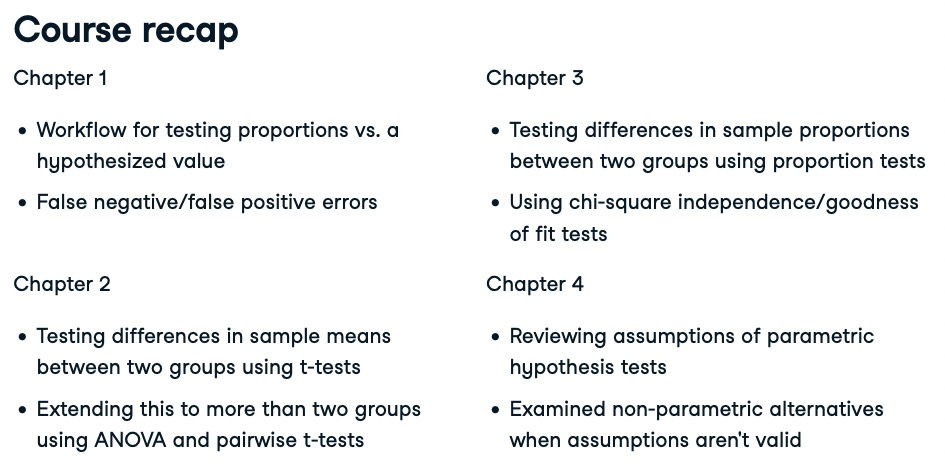

## Hypothesis testing is part of a branch of statistics known as `inference.` The techniques used in this course are examples of frequentist statistics. 

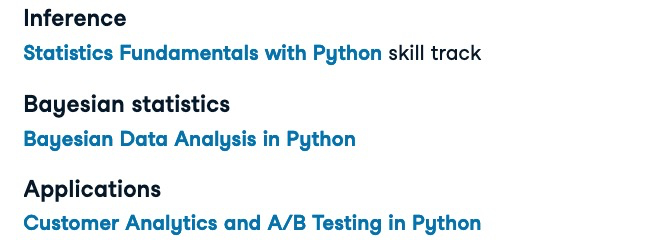